## TASK51 - Unsupervised Machine Learning

Hemant Thapa

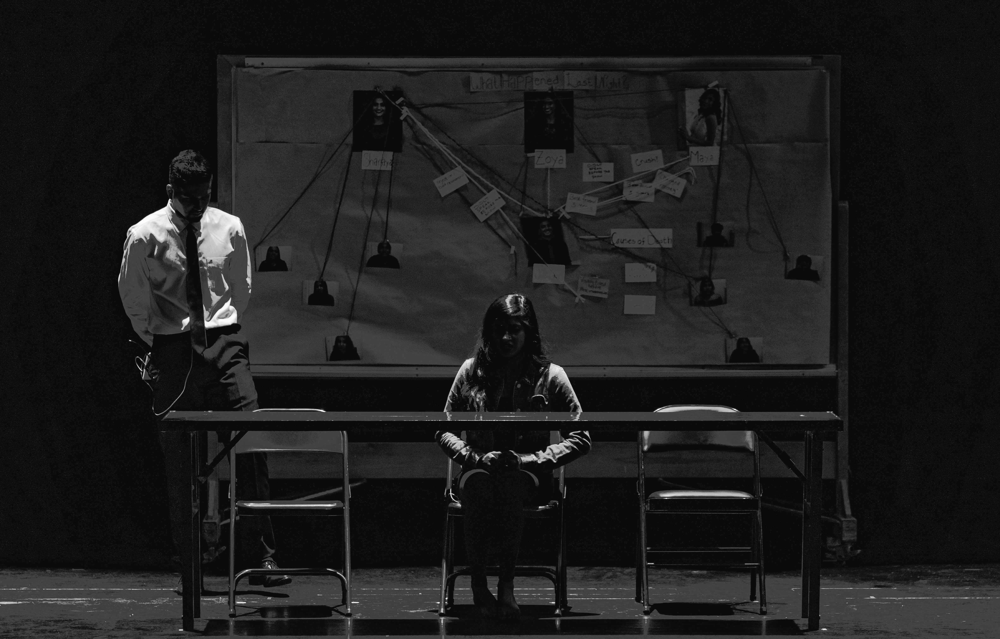

#### LIBRARIES

In [499]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [500]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering

#### IMPORTING DATASET

In [501]:
#Loading data
df = pd.read_csv("UsArrests.csv", index_col="City")

In [502]:
df[:10]

,Murder,Assault,UrbanPop,Rape
City,,,,
Alabama,13.200,236,58,21.200
Alaska,10.000,263,48,44.500
Arizona,8.100,294,80,31.000
Arkansas,8.800,190,50,19.500
California,9.000,276,91,40.600
Colorado,7.900,204,78,38.700
Connecticut,3.300,110,77,11.100
Delaware,5.900,238,72,15.800
Florida,15.400,335,80,31.900


#### CHECKING ROW AND COLUMNS

In [503]:
print(f"Number of rows   :  {df.shape[0]}")
print(f"Number of columns:  {df.shape[1]}")

Number of rows   :  50
Number of columns:  4


#### CHECKING UNIQUE COLUMNS

In [504]:
df.columns.unique()

Index(['Murder', 'Assault', 'UrbanPop', 'Rape'], dtype='object')

#### CONVERTING COLUMNS INTO LOWER CASE

In [505]:
df.columns = df.columns.str.lower()

In [506]:
df.columns.unique()

Index(['murder', 'assault', 'urbanpop', 'rape'], dtype='object')

#### CHECKING DATA TYPES

In [507]:
df.dtypes

murder      float64
assault       int64
urbanpop      int64
rape        float64
dtype: object

#### CHECKING NULL VALUES

In [508]:
df.isnull().sum()

murder      0
assault     0
urbanpop    0
rape        0
dtype: int64

#### CHECKING MININMUM, MAXIMUM AND MEAN VALUE

In [509]:
stats = df.describe()
selected_stats = stats.loc[["count", "mean", "std", "min", "max"]].transpose()
selected_stats

,count,mean,std,min,max
murder,50.000,7.788,4.356,0.800,17.400
assault,50.000,170.760,83.338,45.000,337.000
urbanpop,50.000,65.540,14.475,32.000,91.000
rape,50.000,21.232,9.366,7.300,46.000


#### EXAMINE TYPES

In [510]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50 entries, Alabama to Wyoming
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   murder    50 non-null     float64
 1   assault   50 non-null     int64  
 2   urbanpop  50 non-null     int64  
 3   rape      50 non-null     float64
dtypes: float64(2), int64(2)
memory usage: 2.0+ KB


#### COUNTING MISSING VALUES

In [511]:
#Count missing values
missing = df.isnull().sum()
relevant_missing = pd.DataFrame(missing, columns=["missing"])
relevant_missing

,missing
murder,0
assault,0
urbanpop,0
rape,0


#### COMPILING MISSING VALUES ON THE TABULAR INFORMATION, WE HAVE SO FAR INTO A SINGLE DATAFRAME

In [512]:
frames = [relevant_missing, selected_stats]
summary = pd.concat(frames, axis=1)
summary.rename(columns = {0:"missing"}, inplace=True)
summary.to_csv('summary.csv', index=True)
summary

,missing,count,mean,std,min,max
murder,0,50.000,7.788,4.356,0.800,17.400
assault,0,50.000,170.760,83.338,45.000,337.000
urbanpop,0,50.000,65.540,14.475,32.000,91.000
rape,0,50.000,21.232,9.366,7.300,46.000


In [513]:
df[:5]

,murder,assault,urbanpop,rape
City,,,,
Alabama,13.200,236,58,21.200
Alaska,10.000,263,48,44.500
Arizona,8.100,294,80,31.000
Arkansas,8.800,190,50,19.500
California,9.000,276,91,40.600


#### PLOT HISTOGRAMS

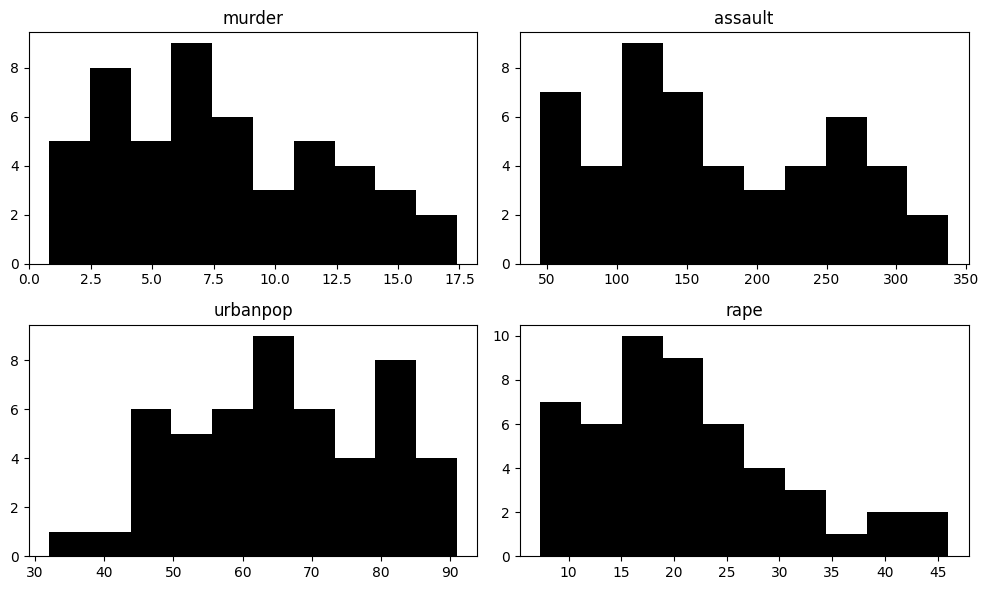

In [514]:
histograms = df.hist(color='black', grid=False, figsize=(10,6))
plt.tight_layout()
plt.show()

1. Assault has highest count between 100 to 120
2. Urban pop has highest count between 62 to 68
3. Rape has highest count between 15 to 18
4. Murder has highest count between 6 to 7

#### CORRELATION MATRIX

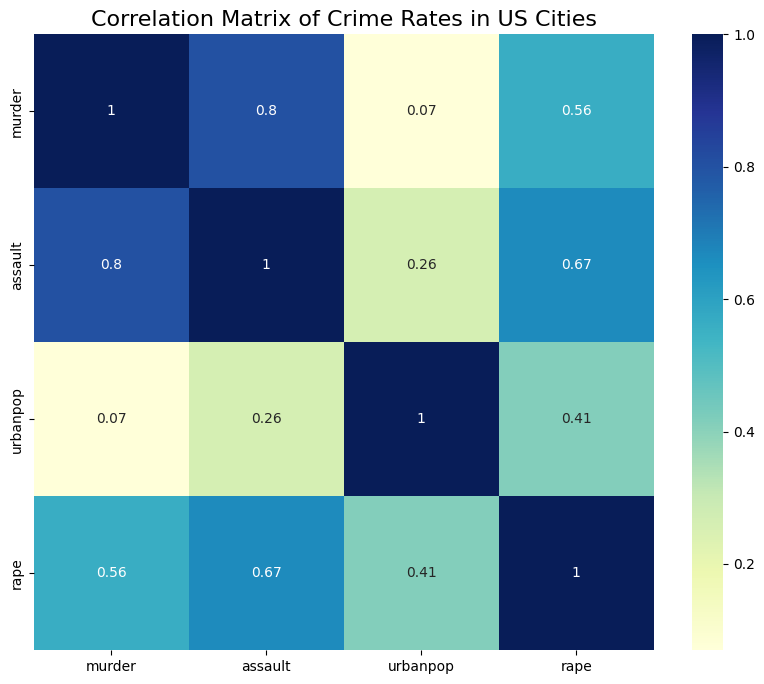

In [515]:
# Calculate the correlation matrix
corr = df.corr()

# Set the size of the figure
plt.figure(figsize=(10,8))

# Plot the correlation matrix
sns.heatmap(corr, annot=True, cmap="YlGnBu")

# Add a title to the plot
plt.title("Correlation Matrix of Crime Rates in US Cities", fontsize=16)

# Show the plot
plt.show()

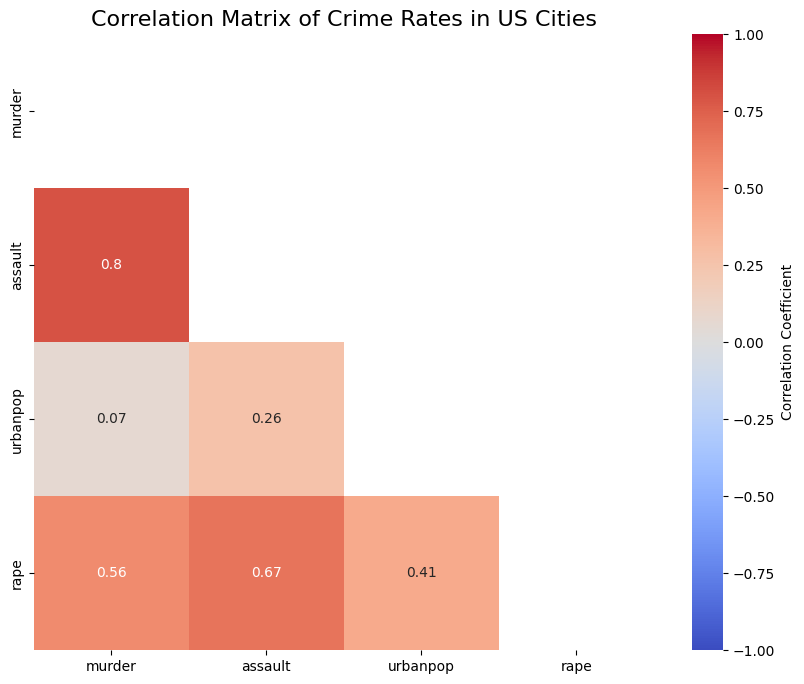

In [516]:
# Create a mask to visualize only the upper triangle of the matrix
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))

# Set the size of the figure
plt.figure(figsize=(10,8))

# Plot the heatmap
sns.heatmap(df.corr(), mask=mask, cmap="coolwarm", annot=True, vmin=-1, vmax=1, cbar_kws={'label': 'Correlation Coefficient'})

# Add a title to the plot
plt.title("Correlation Matrix of Crime Rates in US Cities", fontsize=16)

# Show the plot
plt.show()

1. With 0.80 of Highest correlation between Assault and Murder
2. Assualt and rape is second highest with 0.67
3. Third highest crime is Murder and rape has 0.56 
4. rest is below 0.50


#### SCATTER PLOT MATRIX

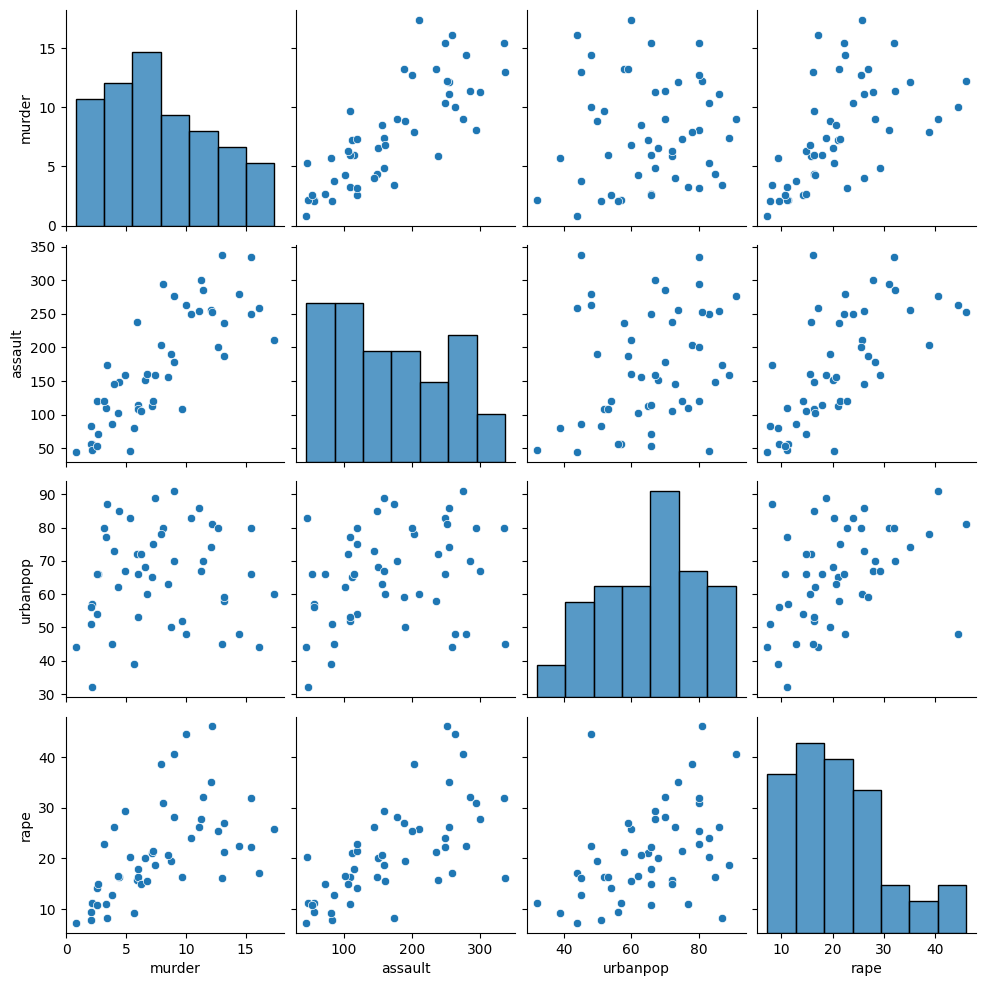

In [518]:
# Plot the scatter matrix
sns.pairplot(df)

# Show the plot
plt.show()

#### APPLYING PCA

In [519]:
#Importing dataset again for PCA
df = pd.read_csv("UsArrests.csv")

In [520]:
#Printing top 5 row and columns
df.head()

,City,Murder,Assault,UrbanPop,Rape
0,Alabama,13.200,236,58,21.200
1,Alaska,10.000,263,48,44.500
2,Arizona,8.100,294,80,31.000
3,Arkansas,8.800,190,50,19.500
4,California,9.000,276,91,40.600


In [521]:
#Declaring features
np.set_printoptions(precision=2)
X = df.drop(['City'], axis=1).values.squeeze()

In [522]:
X

array([[ 13.2, 236. ,  58. ,  21.2],
       [ 10. , 263. ,  48. ,  44.5],
       [  8.1, 294. ,  80. ,  31. ],
       [  8.8, 190. ,  50. ,  19.5],
       [  9. , 276. ,  91. ,  40.6],
       [  7.9, 204. ,  78. ,  38.7],
       [  3.3, 110. ,  77. ,  11.1],
       [  5.9, 238. ,  72. ,  15.8],
       [ 15.4, 335. ,  80. ,  31.9],
       [ 17.4, 211. ,  60. ,  25.8],
       [  5.3,  46. ,  83. ,  20.2],
       [  2.6, 120. ,  54. ,  14.2],
       [ 10.4, 249. ,  83. ,  24. ],
       [  7.2, 113. ,  65. ,  21. ],
       [  2.2,  56. ,  57. ,  11.3],
       [  6. , 115. ,  66. ,  18. ],
       [  9.7, 109. ,  52. ,  16.3],
       [ 15.4, 249. ,  66. ,  22.2],
       [  2.1,  83. ,  51. ,   7.8],
       [ 11.3, 300. ,  67. ,  27.8],
       [  4.4, 149. ,  85. ,  16.3],
       [ 12.1, 255. ,  74. ,  35.1],
       [  2.7,  72. ,  66. ,  14.9],
       [ 16.1, 259. ,  44. ,  17.1],
       [  9. , 178. ,  70. ,  28.2],
       [  6. , 109. ,  53. ,  16.4],
       [  4.3, 102. ,  62. ,  16.5],
 

In [523]:
#Checking row and columns of features
X.shape

(50, 4)

The PCA (Principal Component Analysis) on the data in the variable X. 

The "fit_transform" method of the PCA object pca fits the PCA model to the data in X and returns the transformed data in the variable "X_trains".

The purpose of PCA is to reduce the dimensionality of the data while preserving as much of its information as possible. 

After fitting the PCA model to the data, the transformed data will have a lower number of dimensions than the original data in "X".

In [524]:
# Apply PCA
pca = PCA(n_components=4)
pca

PCA(n_components=4)

In [525]:

X_trains = pca.fit_transform(X)

In [526]:
X_trains.shape

(50, 4)

In [527]:
#Converting to DataFrame
df_pca = pd.DataFrame(X_trains)

In [528]:
#Printing standard values
std = df_pca.describe().transpose()['std']
print(f"Standard value: {std.values}")

Standard value: [83.73 14.21  6.49  2.48]


In [529]:
#printing pca variance ratio
print(f"Proportion of Variance Explained: {pca.explained_variance_ratio_}")

Proportion of Variance Explained: [9.66e-01 2.78e-02 5.80e-03 8.49e-04]


In [530]:
#printing pca variance sum values
print(f"Cumulative Proportion: {np.cumsum(pca.explained_variance_)}")

Cumulative Proportion: [7011.11 7213.11 7255.22 7261.38]


In [531]:
def biplot(score,coeff,labels=None,points=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())

    fig, ax = plt.subplots()    

    ax.scatter(xs * scalex,ys * scaley,s=5)

    for i in range(0,len(xs)):
        txt = df['City'][i]
        ax.annotate(txt, (xs[i]* scalex, ys[i]* scaley))

    for i in range(n):
        ax.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid()

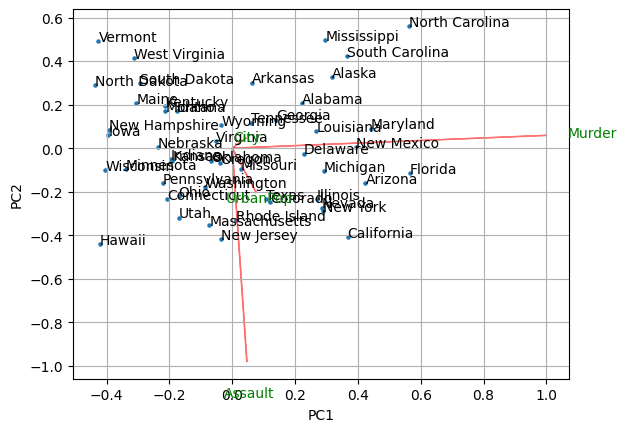

In [532]:
#printing graph
biplot(X_trains[:,0:2], np.transpose(pca.components_[0:2, :]), list(df.columns[:4]), list(df['City']))
plt.show()

##### The Length of each features is indicated by the length of the arrows on the biplot, the corresponds to the magnitude of the values in the eigenvectors. From the biplot, we can see that Murder and Assualt are the most important features the arrow to each of these dominate the biplot

#### STANDARDISED DATA

In [538]:
X_std = StandardScaler().fit_transform(X)
std_pca = PCA()
X_std_trains = std_pca.fit_transform(X_std)

In [539]:
df_std_pca = pd.DataFrame(X_std_trains)
df_std_pca.head()

,0,1,2,3
0,0.986,1.133,-0.444,0.156
1,1.950,1.073,2.040,-0.439
2,1.763,-0.746,0.055,-0.835
3,-0.141,1.120,0.115,-0.183
4,2.524,-1.543,0.599,-0.342


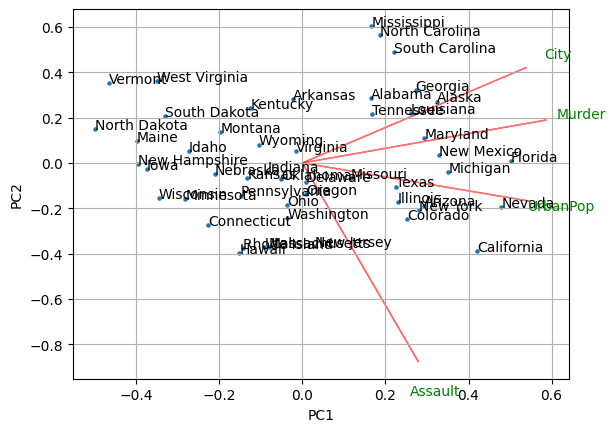

In [540]:
biplot(X_std_trains[:,0:2], np.transpose(std_pca.components_[0:2, :]), list(df.columns[:4]))
plt.show()

##### We see that the standardised data results in far variables being utilised to explain the variance, as the large numbers no longer dominate it.

#### PLOTTING CUMULATIVE VARIANCE

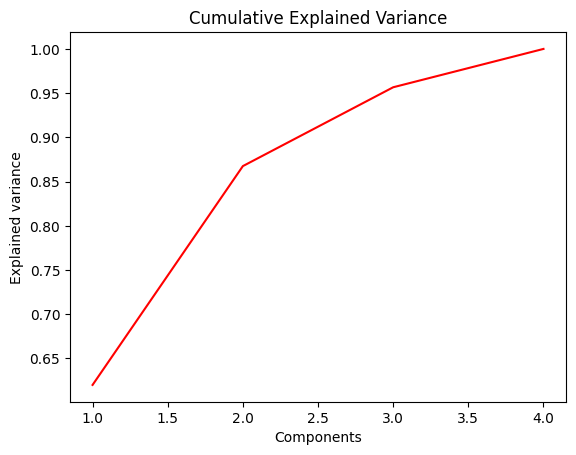

In [433]:
# Cumulative variance plot
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(std_pca.explained_variance_ratio_ )+1),
         np.cumsum(std_pca.explained_variance_ratio_),
         c='red')
plt.title("Cumulative Explained Variance")
plt.show()

#### PLOTTING SCREE PLOT

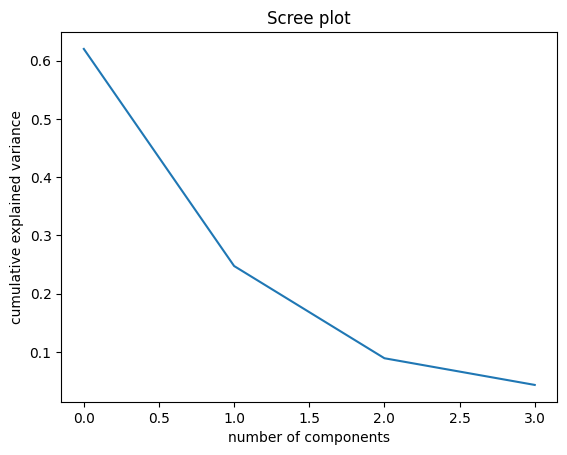

In [434]:
# Scree plot
plt.plot(std_pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("Scree plot")
plt.show()

#### HIERARCHICAL CLUSTERING

In [435]:
df = pd.read_csv("UsArrests.csv", index_col="City")

In [436]:
pca_df = pd.DataFrame(X_std_trains[:,0:5], index = df.index)
pca_df.head()

,0,1,2,3
City,,,,
Alabama,0.986,1.133,-0.444,0.156
Alaska,1.950,1.073,2.040,-0.439
Arizona,1.763,-0.746,0.055,-0.835
Arkansas,-0.141,1.120,0.115,-0.183
California,2.524,-1.543,0.599,-0.342


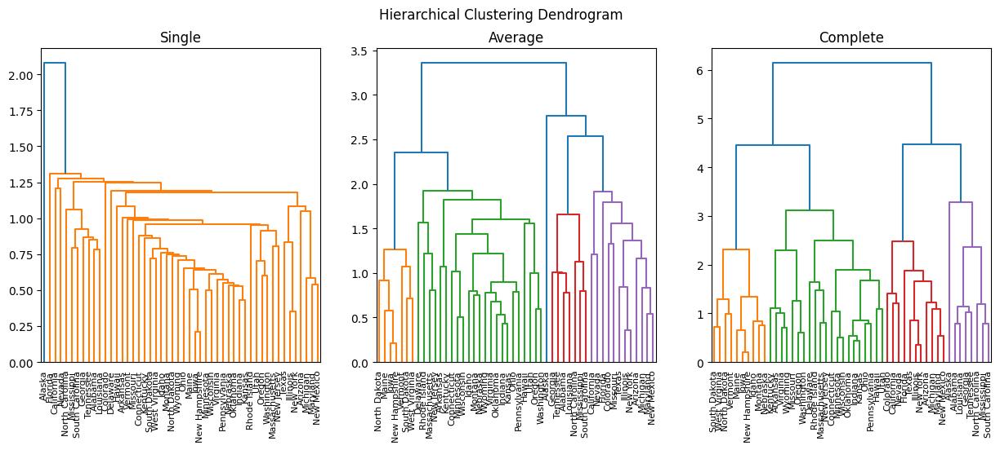

In [437]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(pca_df)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,5)) #set figure size here, width=15, height=5
fig.suptitle('Hierarchical Clustering Dendrogram')
ax1.set_title("Single")
dendrogram(linkage(pca_df, method='single'), labels=pca_df.index, ax=ax1) #change method: eg. single, average, complete...
ax2.set_title("Average")
dendrogram(linkage(pca_df, method='average'), labels=pca_df.index, ax=ax2)
ax3.set_title("Complete")
dendrogram(linkage(pca_df, method='complete'), labels=pca_df.index, ax=ax3)
plt.show()

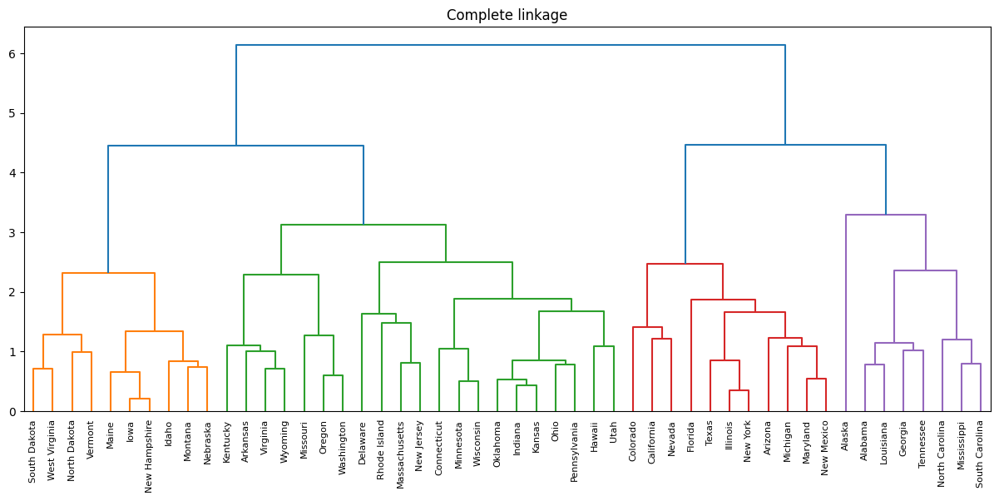

In [438]:
plt.figure(figsize=(15,6))
plt.title("Complete linkage")
dendrogram(linkage(pca_df, method='complete'), labels=pca_df.index)
plt.show()

#### KMEANS - CLUSTERING PLOT

In [444]:
# We extract the first two components
x = X_std_trains[:,0]
y = X_std_trains[:,1]

In [445]:
# Fit k-means
k=3
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(pca_df)

In [447]:
cluster_labels

array([1, 1, 1, 2, 1, 1, 0, 0, 1, 1, 0, 2, 1, 0, 2, 0, 2, 1, 2, 1, 0, 1,
       2, 1, 1, 2, 2, 1, 2, 0, 1, 1, 1, 2, 0, 0, 0, 0, 0, 1, 2, 1, 1, 0,
       2, 0, 0, 2, 2, 0], dtype=int32)

In [448]:
cent = kmeans.cluster_centers_
cent

array([[-4.72e-01, -7.43e-01, -1.64e-01,  2.07e-02],
       [ 1.66e+00,  3.00e-01,  3.20e-03,  6.03e-04],
       [-1.83e+00,  4.21e-01,  1.83e-01, -2.45e-02]])

In [454]:
#Checking index
df.index

Index(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
       'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
       'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
       'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
       'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
       'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'],
      dtype='object', name='City')

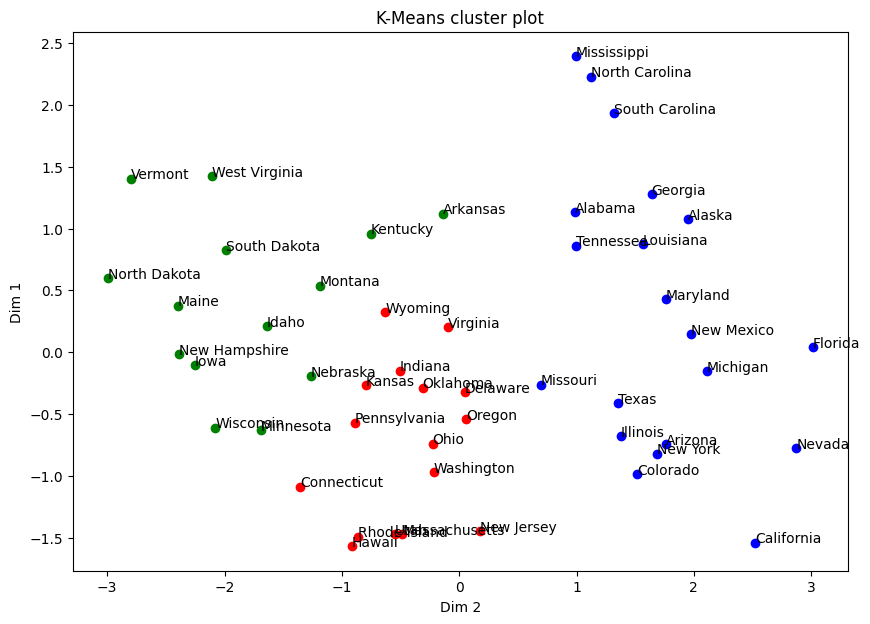

In [466]:
# Plot clusters
fig, ax = plt.subplots(figsize=(10,7))
colours = 'rbgy'
for i in range(0,k):
    ax.scatter(x[cluster_labels == i],y[cluster_labels == i],c = colours[i]) 

for i in range(0,len(x)):
        txt = df.index[i]
        ax.annotate(txt, (x[i], y[i]))
ax.set_title("K-Means cluster plot")
ax.set_xlabel("Dim 2")
ax.set_ylabel("Dim 1")
plt.show()

#### Profile to Github for portfolios

https://github.com/harryworlds

Image reference: 
    
https://images.pexels.com/photos/2157191/pexels-photo-2157191.jpeg